In [1]:
import math
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd

## Загрузка аудио файлов

Рассмотрим особенности различных аудио файлов. 

In [2]:
man_speech_file = "audio/man_speech.wav"
piano_file = "audio/piano.wav"
woman_speech_file = "audio/woman_speech.wav"

Прослушаем их:

In [3]:
ipd.Audio(man_speech_file)

In [4]:
ipd.Audio(piano_file)

In [5]:
ipd.Audio(woman_speech_file)

Можно заметить, что аудио файлы имеют разную длительность, исправим это, пусть аудио будет длиться 8 секунд. Существует множество вариантов, как можно это сделать. Рассмотрим два варианта.

1. Использование библиотеки pydub

In [9]:
from pydub import AudioSegment
import ffmpeg

sound = AudioSegment.from_file(piano_file)

time = 8 * 1000                    # время в мс
piano_file_short = sound[:time]    # обрежем аудио файл

piano_file_short.export(r"audio/piano_short.wav", format="wav");

Загрузим и прослушаем полученное аудио:

In [7]:
piano_file_short = "audio/piano_short.wav"
ipd.Audio(piano_file_short)

2. При загрузке аудио файла с помощью Librosa

In [8]:
woman, sr_woman = librosa.load(woman_speech_file, duration=8)
print('Audio Length:', len(woman))
print('Sampling Rate:', sr_woman)

Audio Length: 176400
Sampling Rate: 22050


Загрузим остальные аудио файлы:

In [9]:
piano, sr_piano = librosa.load(piano_file_short)
print('Audio Length:', len(piano))
print('Sampling Rate:', sr_piano)

Audio Length: 176400
Sampling Rate: 22050


In [10]:
man, sr_man = librosa.load(man_speech_file)
print('Audio Length:', len(man))
print('Sampling Rate:', sr_man)

Audio Length: 189440
Sampling Rate: 22050


Файл с речью длится не ровно 8 секунд, обрежем и его:

In [11]:
man, sr_man = librosa.load(man_speech_file, duration=8)
print('Audio Length:', len(man))
print('Sampling Rate:', sr_man)

Audio Length: 176400
Sampling Rate: 22050


## Вычисление спектрограмм

In [12]:
FRAME_SIZE = 2048
HOP_SIZE = 512

In [13]:
man_spec = librosa.stft(man, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
piano_spec = librosa.stft(piano, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
woman_spec = librosa.stft(woman, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [14]:
print('Man Speech Spectrogram: ', man_spec.shape)
print('Piano Spectrogram: ', piano_spec.shape)
print('Woman Speech Spectrogram: ', woman_spec.shape)

Man Speech Spectrogram:  (1025, 345)
Piano Spectrogram:  (1025, 345)
Woman Speech Spectrogram:  (1025, 345)


## Вычисление отношения энергии полосы

In [15]:
def calculate_split_frequency_bin(split_frequency, sample_rate, 
                                  num_frequency_bins):
    
    frequency_range = sample_rate / 2
    frequency_delta_per_bin = frequency_range / num_frequency_bins
    split_frequency_bin = math.floor(split_frequency / frequency_delta_per_bin)
    
    return int(split_frequency_bin)

In [16]:
split_frequency_bin = calculate_split_frequency_bin(2000, 22050, 1025)
print('Split Frequency Bin: ',split_frequency_bin)

Split Frequency Bin:  185


In [17]:
def band_energy_ratio(spectrogram, split_frequency, sample_rate):
    
    split_frequency_bin = calculate_split_frequency_bin(split_frequency, 
                                                        sample_rate, 
                                                        len(spectrogram[0]))
    band_energy_ratio = []
    
    # Рассчитаем спектрограмму мощности
    power_spectrogram = np.abs(spectrogram) ** 2
    power_spectrogram = power_spectrogram.T
    
    # Рассчитаем значение BER для каждого фрейма
    for frame in power_spectrogram:
        sum_power_low_frequencies = frame[:split_frequency_bin].sum()
        sum_power_high_frequencies = frame[split_frequency_bin:].sum()
        band_energy_ratio_current_frame = sum_power_low_frequencies / sum_power_high_frequencies
        band_energy_ratio.append(band_energy_ratio_current_frame)
    
    return np.array(band_energy_ratio)

In [18]:
ber_man= band_energy_ratio(man_spec, 2000, sr_man)
ber_piano = band_energy_ratio(piano_spec, 2000, sr_piano)
ber_woman = band_energy_ratio(woman_spec, 2000, sr_woman)

In [19]:
print('BER for Man Speech: ', len(ber_man))
print('BER for Piano: ', len(ber_piano))
print('BER for Woman Speech: ', len(ber_woman))

BER for Man Speech:  345
BER for Piano:  345
BER for Woman Speech:  345


Визуализируем отношения энергии полосы:

In [20]:
frames = range(len(ber_man))
t = librosa.frames_to_time(frames, hop_length=HOP_SIZE)

Значение t для рассматриваемых сигналов будет одинаковым.

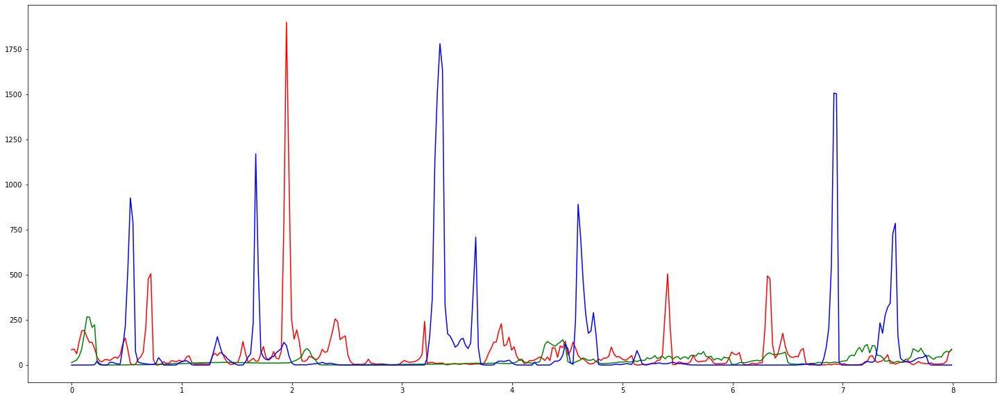

In [21]:
plt.figure(figsize=(25, 10))

plt.plot(t, ber_man, color="r")
plt.plot(t, ber_piano, color="g")
plt.plot(t, ber_woman, color="b")

plt.show()

## Спектральный центроид

In [22]:
sc_man = librosa.feature.spectral_centroid(y=man, sr=sr_man, 
                                           n_fft=FRAME_SIZE,
                                           hop_length=HOP_SIZE)[0]
sc_piano = librosa.feature.spectral_centroid(y=piano, sr=sr_piano, 
                                             n_fft=FRAME_SIZE,
                                             hop_length=HOP_SIZE)[0]
sc_woman = librosa.feature.spectral_centroid(y=woman, sr=sr_woman, 
                                             n_fft=FRAME_SIZE,
                                             hop_length=HOP_SIZE)[0]

In [23]:
print('Spectral Centroid for Man Speech: ', sc_man.shape)
print('Spectral Centroid for Piano: ', sc_piano.shape)
print('Spectral Centroid for Woman Speech: ', sc_woman.shape)

Spectral Centroid for Man Speech:  (345,)
Spectral Centroid for Piano:  (345,)
Spectral Centroid for Woman Speech:  (345,)


Визуализация:

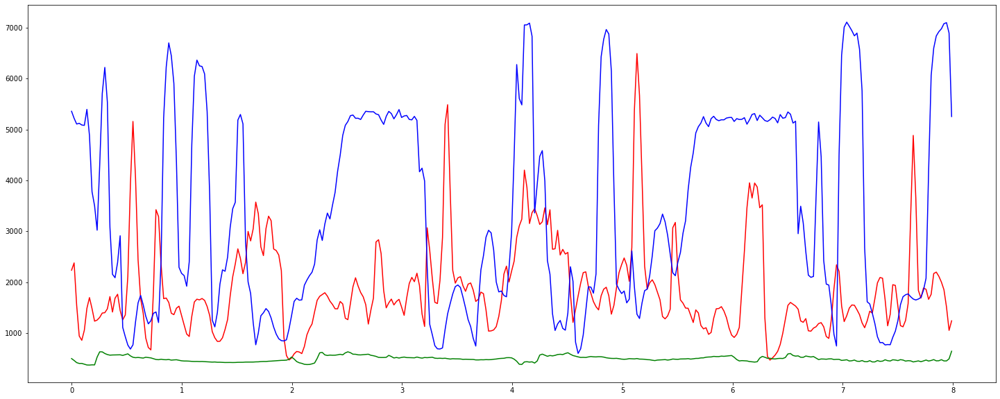

In [24]:
plt.figure(figsize=(25,10))

plt.plot(t, sc_man, color='r')
plt.plot(t, sc_piano, color='g')
plt.plot(t, sc_woman, color='b')

plt.show()

## Спектральная полоса пропускания 

In [25]:
ban_man = librosa.feature.spectral_bandwidth(y=man, sr=sr_man, 
                                             n_fft=FRAME_SIZE,
                                             hop_length=HOP_SIZE)[0]
ban_piano = librosa.feature.spectral_bandwidth(y=piano, sr=sr_piano, 
                                               n_fft=FRAME_SIZE,
                                               hop_length=HOP_SIZE)[0]
ban_woman = librosa.feature.spectral_bandwidth(y=woman, sr=sr_woman, 
                                               n_fft=FRAME_SIZE,
                                               hop_length=HOP_SIZE)[0]

In [26]:
print('Spectral Bandwidth for Man Speech: ', ban_man.shape)
print('Spectral Bandwidth for Piano: ', ban_piano.shape)
print('Spectral Bandwidth for Woman Speech: ', ban_woman.shape)

Spectral Bandwidth for Man Speech:  (345,)
Spectral Bandwidth for Piano:  (345,)
Spectral Bandwidth for Woman Speech:  (345,)


Визуализация:

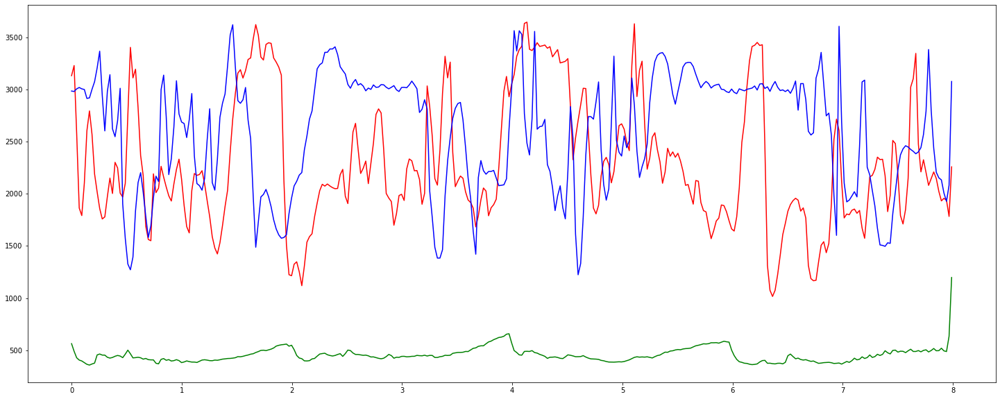

In [27]:
plt.figure(figsize=(25,10))

plt.plot(t, ban_man, color='r')
plt.plot(t, ban_piano, color='g')
plt.plot(t, ban_woman, color='b')

plt.show()

## Спектральный спад 

In [28]:
rol_man = librosa.feature.spectral_rolloff(y=man, sr=sr_man, 
                                           n_fft=FRAME_SIZE, 
                                           hop_length=HOP_SIZE)[0]
rol_piano = librosa.feature.spectral_rolloff(y=piano, sr=sr_piano, 
                                             n_fft=FRAME_SIZE, 
                                             hop_length=HOP_SIZE)[0]
rol_woman = librosa.feature.spectral_rolloff(y=woman, sr=sr_woman, 
                                             n_fft=FRAME_SIZE,
                                             hop_length=HOP_SIZE)[0]

In [29]:
print('Spectral Rolloff for Man Speech: ', rol_man.shape)
print('Spectral Rolloff for Piano: ', rol_piano.shape)
print('Spectral Rolloff for Woman Speech: ', rol_woman.shape)

Spectral Rolloff for Man Speech:  (345,)
Spectral Rolloff for Piano:  (345,)
Spectral Rolloff for Woman Speech:  (345,)


Визуализация:

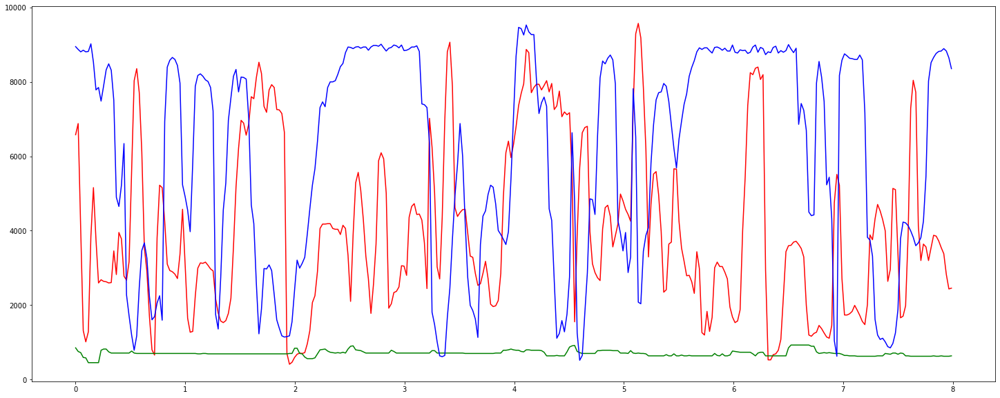

In [30]:
plt.figure(figsize=(25,10))

plt.plot(t, rol_man, color='r')
plt.plot(t, rol_piano, color='g')
plt.plot(t, rol_woman, color='b')

plt.show()

## Скорость пересечения нуля 

In [31]:
zero_man = librosa.feature.zero_crossing_rate(y=man, frame_length=FRAME_SIZE, 
                                              hop_length=HOP_SIZE)[0]
zero_piano = librosa.feature.zero_crossing_rate(y=piano, frame_length=FRAME_SIZE,
                                                hop_length=HOP_SIZE)[0]
zero_woman = librosa.feature.zero_crossing_rate(y=woman, frame_length=FRAME_SIZE, 
                                                hop_length=HOP_SIZE)[0]

In [32]:
print('Zero Crossing Rate for Man Speech: ', zero_man.shape)
print('Zero Crossing Rate for Piano: ', zero_piano.shape)
print('Zero Crossing Rate for Woman Speech: ', zero_woman.shape)

Zero Crossing Rate for Man Speech:  (345,)
Zero Crossing Rate for Piano:  (345,)
Zero Crossing Rate for Woman Speech:  (345,)


Визуализация:

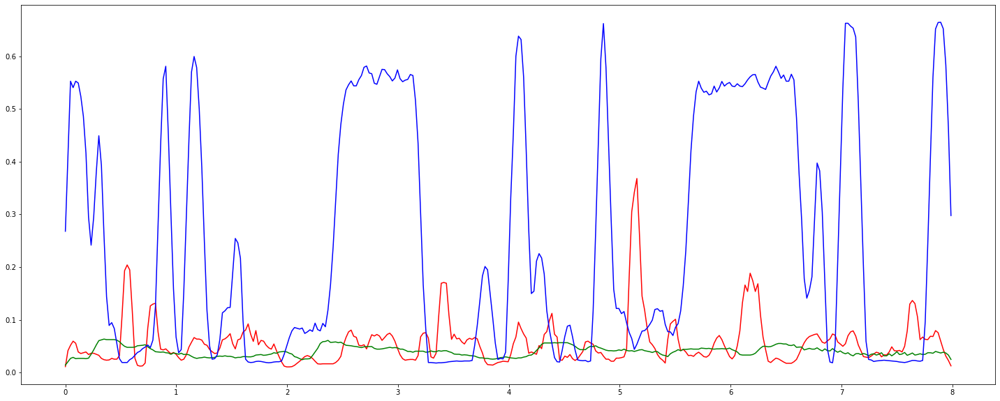

In [33]:
plt.figure(figsize=(25,10))

plt.plot(t, zero_man, color='r')
plt.plot(t, zero_piano, color='g')
plt.plot(t, zero_woman, color='b')

plt.show()

In [34]:
zero_count_man = librosa.zero_crossings(y=man, pad=False)
zero_count_piano = librosa.zero_crossings(y=piano, pad=False)
zero_count_woman = librosa.zero_crossings(y=woman, pad=False)

In [35]:
print("Man Speech Zero Crossings: ", sum(zero_count_man))
print("Piano Zero Crossings: ", sum(zero_count_piano))
print("Woman Speech Zero Crossings: ", sum(zero_count_woman))

Man Speech Zero Crossings:  10020
Piano Zero Crossings:  7147
Woman Speech Zero Crossings:  45333


## Спектральный контраст 

In [36]:
contr_man = librosa.feature.spectral_contrast(y=man, sr=sr_man, 
                                              n_fft=FRAME_SIZE,
                                              hop_length=HOP_SIZE)[0]
contr_piano = librosa.feature.spectral_contrast(y=piano, sr=sr_piano, 
                                                n_fft=FRAME_SIZE, 
                                                hop_length=HOP_SIZE)[0]
contr_woman = librosa.feature.spectral_contrast(y=woman, sr=sr_woman, 
                                                n_fft=FRAME_SIZE, 
                                                hop_length=HOP_SIZE)[0]

In [37]:
print('Spectral Contrast for Man Speech: ', contr_man.shape)
print('Spectral Contrast for Piano: ', contr_piano.shape)
print('Spectral Contrast for Woman Speech: ', contr_woman.shape)

Spectral Contrast for Man Speech:  (345,)
Spectral Contrast for Piano:  (345,)
Spectral Contrast for Woman Speech:  (345,)


Визуализация:

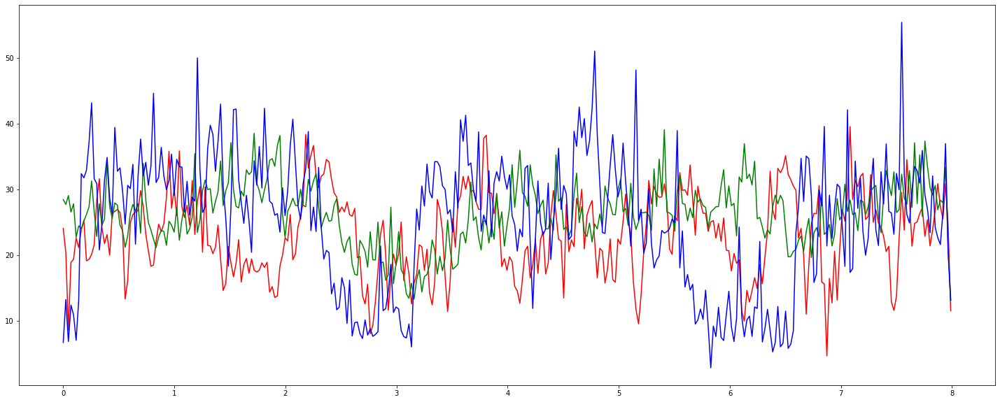

In [38]:
plt.figure(figsize=(25,10))

plt.plot(t, contr_man, color='r')
plt.plot(t, contr_piano, color='g')
plt.plot(t, contr_woman, color='b')

plt.show()